In [42]:
%load_ext autoreload

import os, sys
import networkx as nx

sys.path.insert(0, "../")

%autoreload 2
from mikg.kgraph import *
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from collections import defaultdict, Counter

import random
random.seed(42)

import pickle

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
exprKGs = pickle.load(open("exprkgs.pickle", "rb"))

In [45]:
for x in exprKGs:
    exprKGs[x].kgraph_name = x

In [5]:
kg=exprKGs["Cardiomyocyte"].copy()

In [25]:
kg.get_node_types()

Counter({'gene': 20937, 'geneset': 49319, 'disease': 7797, 'drug': 3211})

In [9]:
gene_kg = kg.to_gene_kgraph()

In [10]:
gene_kg.get_node_types()

Counter({'gene': 20937})

In [11]:
comms = gene_kg.get_communities(minEdgeScore = 1.0, resolution=4)

DiGraph with 853 nodes and 2282 edges


In [12]:
gene_kg.describe_communities(comms)

Number of communities: 83
Average community size 10.27710843373494
Median community size 10.0
Quantile (0.25,0.5,0.75) community size [ 2. 10. 15.]


In [43]:
dmi = DifferentialModuleIdentifier()

In [13]:
sigcomm = dmi.identify_differential_communities(comms, exprKGs, verbose=False)

In [14]:
for ci, comm in enumerate(sigcomm):
    print(comm, len(comms[comm]))

Module 62 20
Module 78 23
Module 3 14
Module 5 16
Module 6 11
Module 9 24
Module 11 12
Module 13 15
Module 14 20
Module 16 26
Module 17 24
Module 19 13
Module 20 20
Module 24 17
Module 25 14
Module 26 13
Module 27 12
Module 28 12
Module 29 21
Module 31 16
Module 33 14
Module 34 21
Module 35 17
Module 38 11
Module 39 16
Module 49 15
Module 74 19
Module 52 15
Module 54 13
Module 56 11
Module 58 10
Module 63 13
Module 61 15
Module 68 13


In [15]:
matplotlib.rcParams['figure.figsize'] = [6, 6]


for ci, comm in enumerate(sigcomm):
    
    if 5 < len(comms[comm]) < 70:
        
        print(comm)
        #kg.plot_communities(exprKGs, [comms[comm]], font_size=6, titles=[comm])
        
    if ci > 10:
        break

Module 62
Module 78
Module 3
Module 5
Module 6
Module 9
Module 11
Module 13
Module 14
Module 16
Module 17
Module 19


In [16]:
kg.get_node_types()

Counter({'gene': 20937, 'geneset': 49319, 'disease': 7797, 'drug': 3211})

In [26]:
kg.get_edge_types()

Counter({'relevant_in': 205076,
         'activates': 112491,
         'part_of': 200831,
         'interacts': 371714,
         'represses': 8381,
         'affects': 35861,
         'targeted_by': 8267})

Module 62
Input Graph Nodes 20
Extended Graph Nodes 85
Extended Graph Edges 243
243


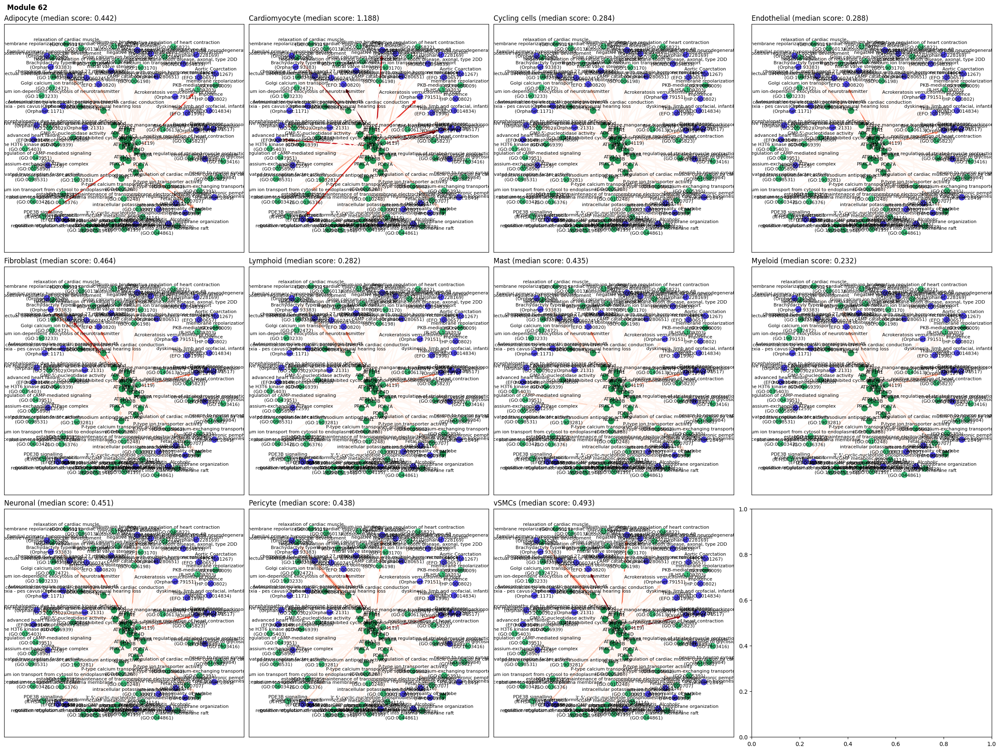

Module 78
Input Graph Nodes 23
Extended Graph Nodes 31
Extended Graph Edges 82
82


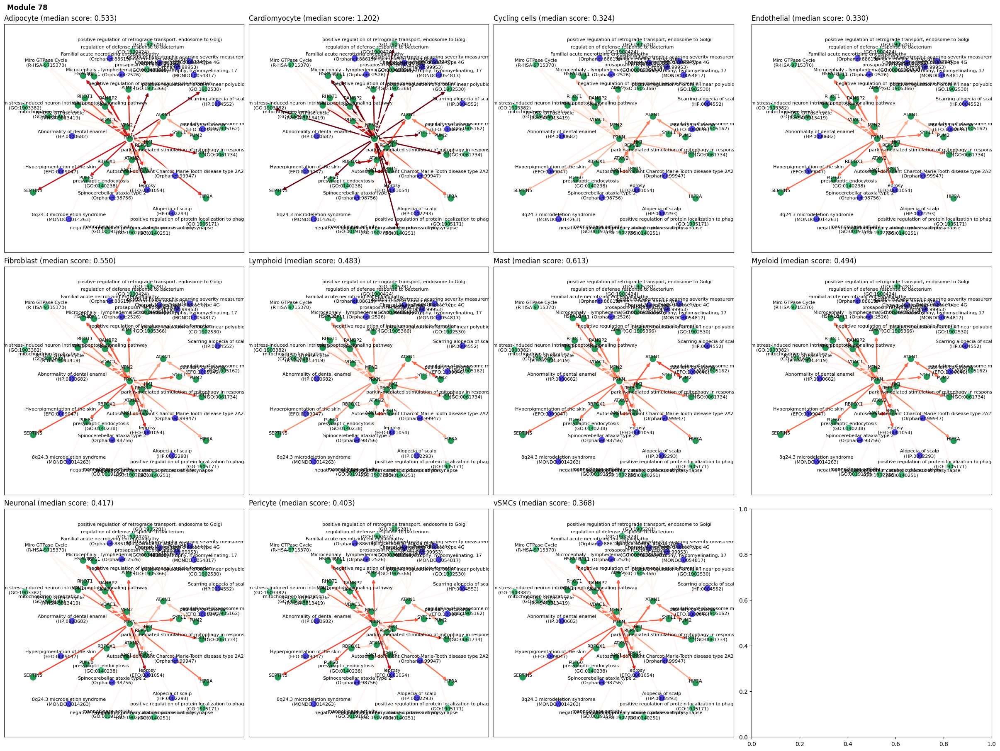

Module 3
Input Graph Nodes 14
Extended Graph Nodes 21
Extended Graph Edges 54
54


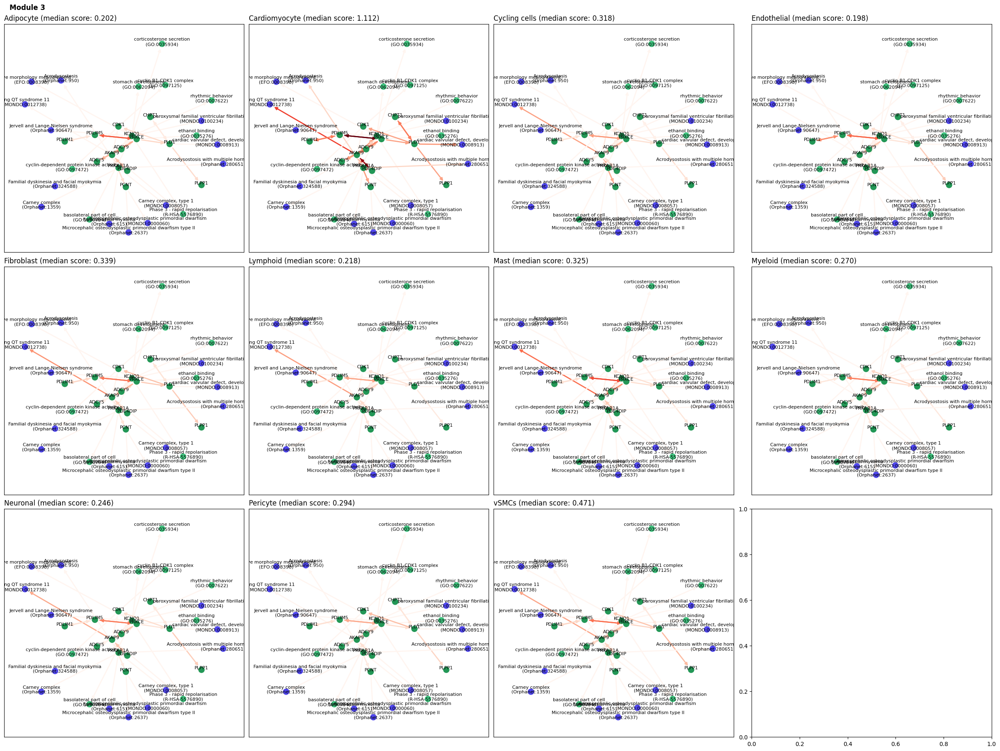

Module 5
Input Graph Nodes 16
Extended Graph Nodes 57
Extended Graph Edges 156
156


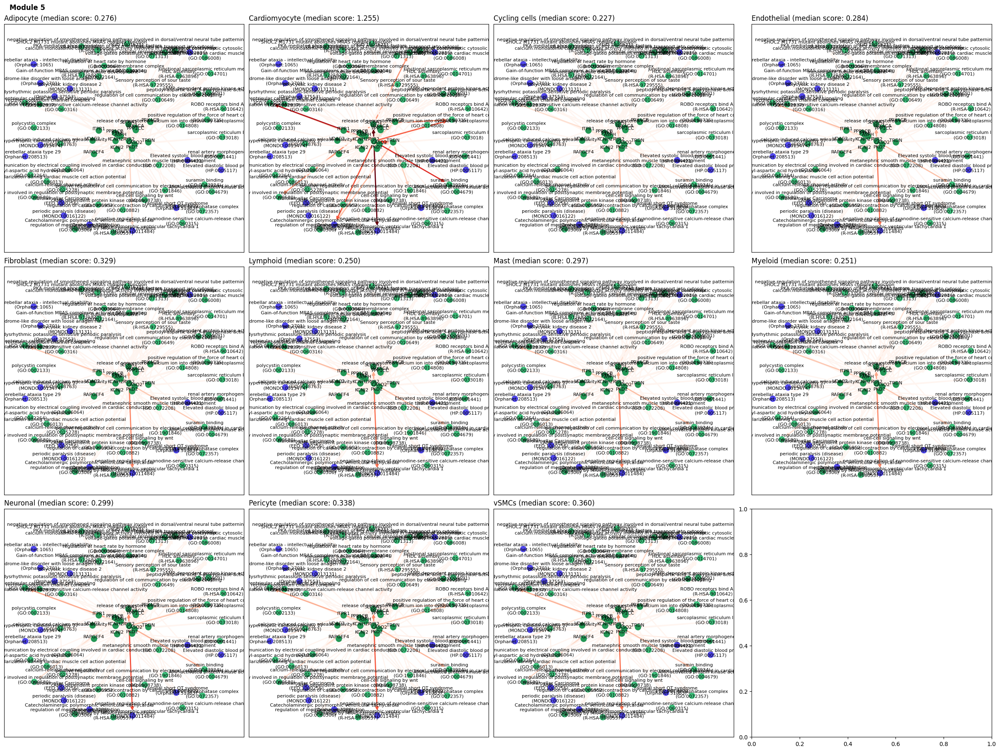

Module 6
Input Graph Nodes 11
Extended Graph Nodes 7
Extended Graph Edges 33
33


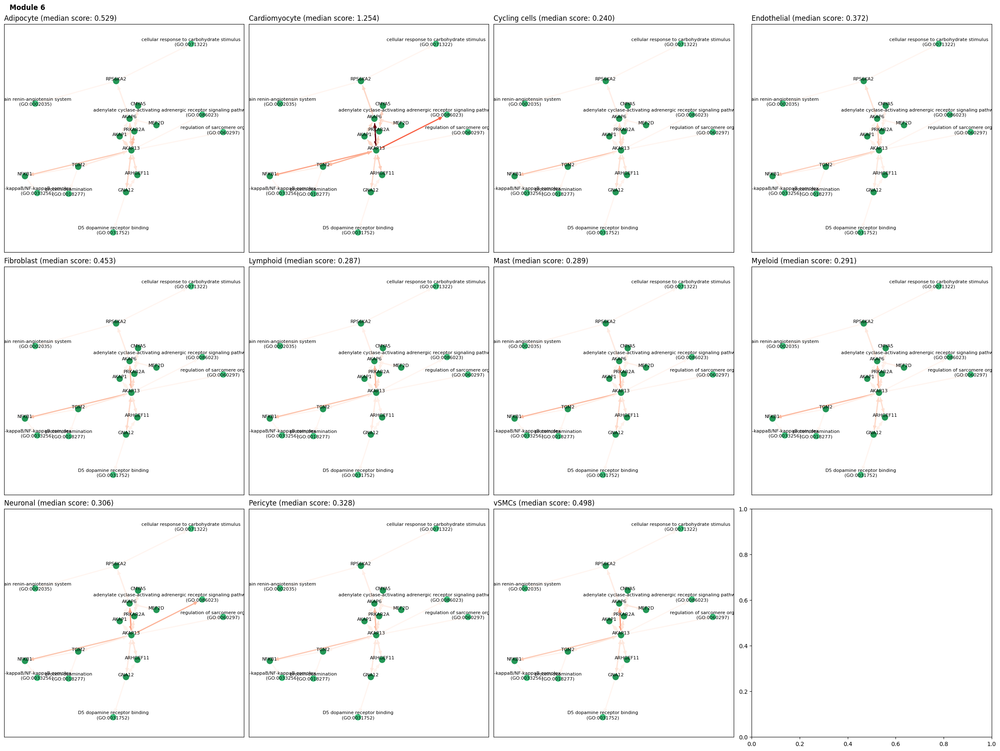

Module 9
Input Graph Nodes 24
Extended Graph Nodes 73
Extended Graph Edges 293
293


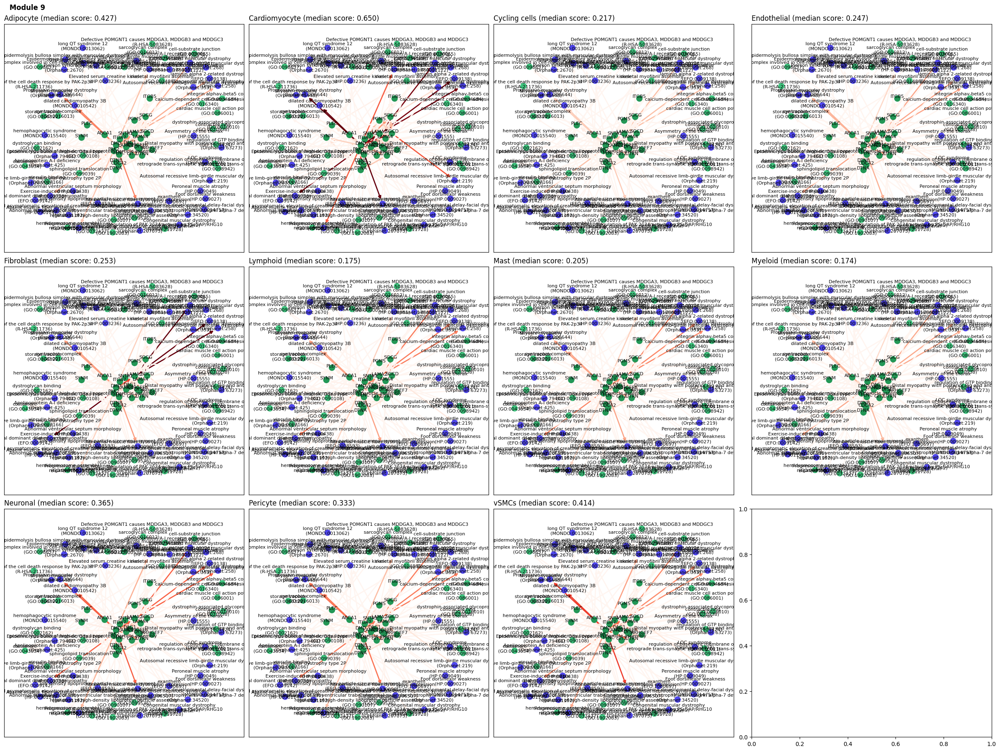

Module 11
Input Graph Nodes 12
Extended Graph Nodes 2
Extended Graph Edges 78
78


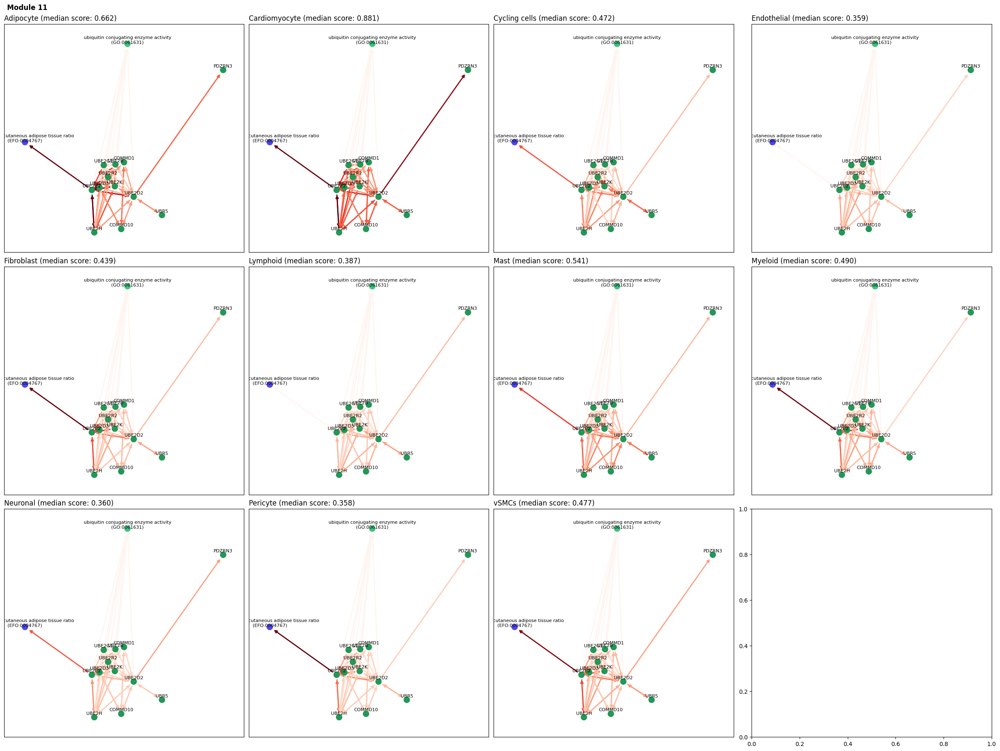

In [47]:
matplotlib.rcParams['figure.figsize'] = [6, 6]


for ci, comm in enumerate(sigcomm):
    
    if 5 < len(comms[comm]) < 70:
        
        print(comm)        
        nwe = NetworkExtender()
        eKG = nwe.extend_network(comms[comm], kg, verbose=False)
        
        #eKG.plot_graph()
        
        dmi.plot_communities(exprKGs, [eKG.kg.nodes], "Cardiomyocyte", main_net=[comms[comm]], font_size=6, titles=[comm])

    if ci > 5:
        break